# Results for `Stereopair DSM`
Paul Montesano & Jordan Caraballo-Vega April-May 2023  

Results for Phase 2, where we apply the UNet-like CNN we developed in Phase 1 to 3 different input stacks:  
    -  Experiment #1: panchromatic stereopairs only  
    -  Experiment #2: disparity map only only  
    -  Experiment #3: panchromatic stereopairs + disparity map

In [10]:
import numpy as np
import pandas as pd
import os
import glob
import math

from plotnine import *
import seaborn as sns

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import Normalize

import sys
sys.path.insert(0, '/home/pmontesa/code/pygeotools')
from pygeotools.lib import filtlib, iolib, malib, warplib
sys.path.insert(0, '/home/pmontesa/code/imview')
from imview.lib import pltlib

In [28]:
MAINDIR = '/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development'

# 3 experiments:  
#     Stereopairs only: ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-v7-mae 
#     Disparity map only: ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-stereo-disparity-v1  
#     Disparity map + Stereopairs: ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-stereo-v1  

#EXPERIMENT_SUBDIR_LIST = ['dsm-test-stereo-disparity-v2']# ['dsm-test-v7-mae', 'dsm-test-disparity-v1','dsm-test-stereo-disparity-v2']   
EXPERIMENT_SUBDIR_LIST = ['dsm-test-v7-mae','dsm-test-disparity-v1','dsm-test-stereo-disparity-v2'] 
EXPERIMENT_NAME_LIST   = ['stereopairs', 'disparity', 'combined']  
EXPERIMENT_DIR_LIST    = [ os.path.join(MAINDIR, NAME, 'results') for NAME in EXPERIMENT_SUBDIR_LIST]
EXPERIMENT_DIR_LIST

['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-v7-mae/results',
 '/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results',
 '/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-stereo-disparity-v2/results']

# Input

In [29]:
# ASP DEMS
outASP_dir = '/home/pmontesa/pmontesa/outASP/cnn_mode_test'
PNAME_LIST = [
    'WV03_20160616_104001001EBDB400_104001001E13F600',
    'WV02_20160623_10300100577C7E00_1030010058580000',
    'WV01_20130825_1020010024E78600_10200100241E6200'              
             ]

PNAME_INDEX_LIST = list(range(0,len(PNAME_LIST)))
               
DICT = {
        'PNAME': PNAME_LIST,
        #'SITE': ['Site 1', 'Site 2', 'Site 3'],
        'EXPERIMENT_NAME': EXPERIMENT_NAME_LIST,
        'ELEV_START': [300,300,350],
        'LWR_PCT': [15,10,10],
        'UPR_PCT': [85,95,95]
}

# Loop Analysis over Input

In [30]:
# This works, but plots dont print to screen - also cant return dfs for summary plotting later
if False:
    from multiprocessing import Pool
    from functools import partial

    with Pool(processes=30) as pool:
        [pool.map(partial(ANALYZE_DSM_PRED, INDIR = EXPERIMENT_DIR, DICT=DICT, REFDSMDIR = outASP_dir, EXPERIMENT_NAME = EXPERIMENT_NAME_LIST[i], CLIM_DZ=(-50,50), ELEV_RANGE=400, SUBSET=True), PNAME_INDEX_LIST) for i, EXPERIMENT_DIR in enumerate(EXPERIMENT_DIR_LIST)]
        #pool.starmap(partial(ANALYZE_DSM_PRED, DICT=DICT, REFDSMDIR = outASP_dir, CLIM_DZ=(-50,50), ELEV_RANGE=400, SUBSET=True), zip( PNAME_INDEX_LIST, EXPERIMENT_DIR_LIST) )

Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-v7-mae/results/WV03_20160616_104001001EBDB400_104001001E13F600/104001001E13F600.r100_0.365m_stacked.cnn-dsm-stereo_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/WV03_20160616_104001001EBDB400_104001001E13F600_ortho_4m_warp.tif']
Length of plot_ma_list: 4
Elev lims: (482.787109375, 507.322265625)
Rounded min elev: 300
WV03_20160616_104001001EBDB400_104001001E13F600


/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(500.0, 580.0), (580.0, 660.0), (660.0, 740.0), (740.0, 820.0), (820.0, 900.0)]
893,045
243,802
106,301
36,446
21,339
           0          1          2          3          4
0 -76.722137 -70.569580 -42.753113   9.339722 -54.225220
1 -69.700806 -80.657898 -48.680115  13.339905 -51.462280
2 -69.311096 -77.040100 -49.050171  -0.731201 -55.487976
3 -69.858582 -50.068970 -56.957031  13.155029 -57.871399
4 -68.451599  10.054138 -40.344177   9.312378 -64.991089

Warping all inputs to the following:
Resolution: 4.0
Extent: [408534.0, 7343490.0, 426522.0, 7358770.0]
Projection: '+proj=utm +zone=6 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 3: /home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-v7-mae/results/WV02_20160623_10300100577C7E00_1030010058580000/1030010058580000.r100_0.514m_stacked.cnn-dsm-stereo.tif
nl: 3820 ns: 4497 res: 4.000
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 3: /home/pmontesa/pmontesa/outASP/cnn_mode_test/W

/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(100.0, 180.0), (180.0, 260.0), (260.0, 340.0), (340.0, 420.0), (420.0, 500.0)]
6,145,149
0


/home/pmontesa/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1369: UserWarning: Warning: converting a masked element to nan.


0
0
0
          0   1   2   3   4
0  2.535614 NaN NaN NaN NaN
1  0.869499 NaN NaN NaN NaN
2 -0.399010 NaN NaN NaN NaN
3  1.153793 NaN NaN NaN NaN
4  0.722916 NaN NaN NaN NaN
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-v7-mae/results/WV01_20130825_1020010024E78600_10200100241E6200/1020010024E78600.r100_0.553m_stacked.cnn-dsm-stereo_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV01_20130825_1020010024E78600_10200100241E6200/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV01_20130825_1020010024E78600_10200100241E6200/WV01_20130825_1020010024E78600_10200100241E6200_ortho_4m_warp.tif']
Length of plot_ma_list: 4
Elev lims: (396.9208984375, 619.5684082031248)
Rounded min elev: 350
WV01_20130825_1020010024E78600_10200100241E6200


/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(400.0, 480.0), (480.0, 560.0), (560.0, 640.0), (640.0, 720.0), (720.0, 800.0)]
1,501,759
1,505,198
573,310
137,503
7,136
           0          1          2          3           4
0 -21.139404 -11.858215 -15.802734 -90.413452 -121.036438
1 -22.823669 -14.603577 -23.858459 -79.442383 -122.777283
2 -21.111389 -15.820709 -19.616455 -86.215576 -120.425781
3 -18.545715 -19.338715  -8.680786 -86.271606 -112.932556
4 -18.112427 -16.494934  -2.965576 -81.129639 -118.590820
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results/WV03_20160616_104001001EBDB400_104001001E13F600/104001001E13F600.r100_0.365m_disparity.cnn-dsm-disparity-v1_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/WV03_20160616_104001001EBDB400_104001001E13F600_ortho_4m_warp.tif']
Length o

/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(500.0, 580.0), (580.0, 660.0), (660.0, 740.0), (740.0, 820.0), (820.0, 900.0)]
893,045
243,802
106,301
36,446
21,339
           0          1           2           3           4
0 -77.666504 -79.474945 -157.740936 -220.945862 -215.371704
1 -78.146667 -81.464966 -158.573669 -101.324890 -212.417480
2 -76.592529 -81.529846 -154.839844 -228.445923 -211.582214
3 -76.336975 -72.309631 -161.999908 -222.801147 -209.220825
4 -77.396790 -72.912476 -156.233063 -224.725647 -220.148804
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results/WV02_20160623_10300100577C7E00_1030010058580000/1030010058580000.r100_0.514m_disparity.cnn-dsm-disparity-v1_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV02_20160623_10300100577C7E00_1030010058580000/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV02_20160623_10300100577C7E00_1030010058580000/WV02_20160623_10300100577C7E00_1030010058580000_ortho_4m_warp.tif']


/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(100.0, 180.0), (180.0, 260.0), (260.0, 340.0), (340.0, 420.0), (420.0, 500.0)]
6,145,149
0


/home/pmontesa/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1369: UserWarning: Warning: converting a masked element to nan.


0
0
0
          0   1   2   3   4
0 -3.247200 NaN NaN NaN NaN
1 -4.059402 NaN NaN NaN NaN
2 -4.665192 NaN NaN NaN NaN
3 -4.928337 NaN NaN NaN NaN
4 -4.799896 NaN NaN NaN NaN
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results/WV01_20130825_1020010024E78600_10200100241E6200/1020010024E78600.r100_0.553m_disparity.cnn-dsm-disparity-v1_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV01_20130825_1020010024E78600_10200100241E6200/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV01_20130825_1020010024E78600_10200100241E6200/WV01_20130825_1020010024E78600_10200100241E6200_ortho_4m_warp.tif']
Length of plot_ma_list: 4
Elev lims: (396.9208984375, 619.5684082031248)
Rounded min elev: 400.0
WV01_20130825_1020010024E78600_10200100241E6200


/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(400.0, 480.0), (480.0, 560.0), (560.0, 640.0), (640.0, 720.0), (720.0, 800.0)]
1,501,767
1,505,246
573,474
137,550
7,184
          0         1          2          3           4
0  0.268005  0.383759 -50.542206 -43.099854 -200.983826
1  0.096130  1.667694 -48.610413 -50.646790 -201.396301
2 -0.734528 -2.255859 -51.407776 -33.700500 -194.739807
3 -1.806580  2.414429 -52.589722 -38.082703 -197.805664
4  1.744873  4.884583 -53.429352 -64.120972 -201.439941
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-stereo-disparity-v2/results/WV03_20160616_104001001EBDB400_104001001E13F600/stack_all_bands_cnn-dsm-stereo-disparity_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/WV03_20160616_104001001EBDB400_104001001E13F600_ortho_4m_warp.tif']
Length of plot_ma_list: 4
Elev l

/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(500.0, 580.0), (580.0, 660.0), (660.0, 740.0), (740.0, 820.0), (820.0, 900.0)]
893,045
243,802
106,301
36,446
21,339
           0          1           2           3           4
0 -56.791138 -50.270752  -98.404663  -94.254272 -160.236328
1 -58.190155 -57.758484  -68.447876  -72.483948 -201.800720
2 -51.487183 -67.830078  -73.391541 -112.859070 -191.044434
3 -40.164124 -50.220581 -106.043579 -114.705017 -197.996948
4 -45.472778 -58.120789  -92.168030  -92.667419 -190.939148
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-stereo-disparity-v2/results/WV02_20160623_10300100577C7E00_1030010058580000/stack_all_bands.cnn-dsm-stereo-disparity_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV02_20160623_10300100577C7E00_1030010058580000/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV02_20160623_10300100577C7E00_1030010058580000/WV02_20160623_10300100577C7E00_1030010058580000_ortho_4m_warp.tif']
Length of pl

/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(100.0, 180.0), (180.0, 260.0), (260.0, 340.0), (340.0, 420.0), (420.0, 500.0)]
6,145,149
0


/home/pmontesa/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1369: UserWarning: Warning: converting a masked element to nan.


0
0
0
          0   1   2   3   4
0 -5.225014 NaN NaN NaN NaN
1  0.265266 NaN NaN NaN NaN
2 -1.361099 NaN NaN NaN NaN
3 -2.806412 NaN NaN NaN NaN
4 -4.542313 NaN NaN NaN NaN
Warped files already exist.
['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-stereo-disparity-v2/results/WV01_20130825_1020010024E78600_10200100241E6200/stack_all_bands.cnn-dsm-stereo-disparity_warp.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV01_20130825_1020010024E78600_10200100241E6200/out-DEM_4m.tif', '/home/pmontesa/pmontesa/outASP/cnn_mode_test/WV01_20130825_1020010024E78600_10200100241E6200/WV01_20130825_1020010024E78600_10200100241E6200_ortho_4m_warp.tif']
Length of plot_ma_list: 4
Elev lims: (396.9208984375, 619.5684082031248)
Rounded min elev: 400.0
WV01_20130825_1020010024E78600_10200100241E6200


/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/lib/function_base.py:4691: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.


Elev bins: [(400.0, 480.0), (480.0, 560.0), (560.0, 640.0), (640.0, 720.0), (720.0, 800.0)]
1,501,767
1,505,246
573,474
137,550
7,184
           0          1          2          3           4
0   0.973297 -39.520844 -11.484497 -57.965210 -143.590454
1   4.659302 -28.252045 -10.042969 -67.948914 -140.309692
2  -4.576477 -37.863647  -5.451843 -53.353577 -150.042725
3 -11.304230 -26.267273   7.400024 -53.717102 -142.947510
4 -15.993347 -20.540710   7.621826 -75.775879 -140.522644


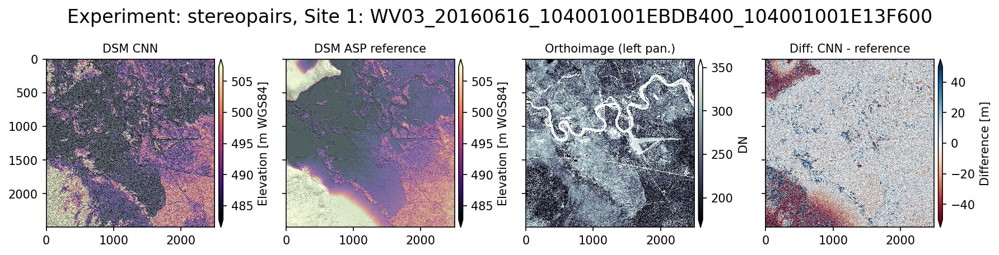

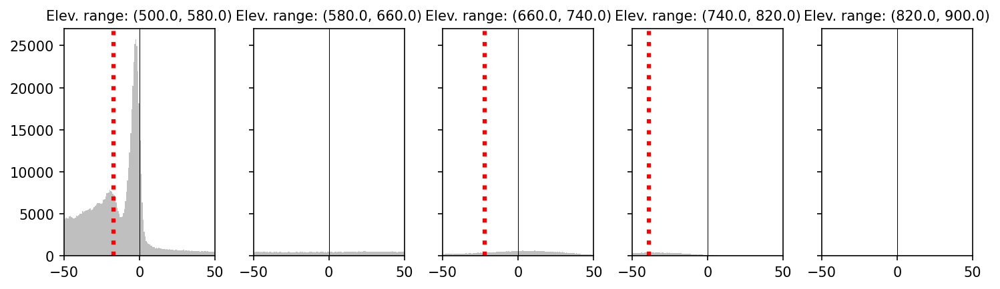

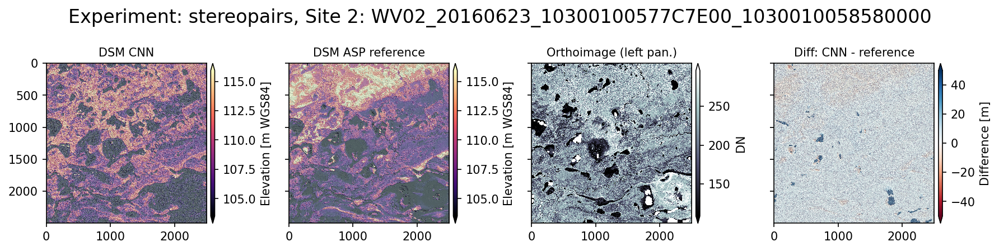

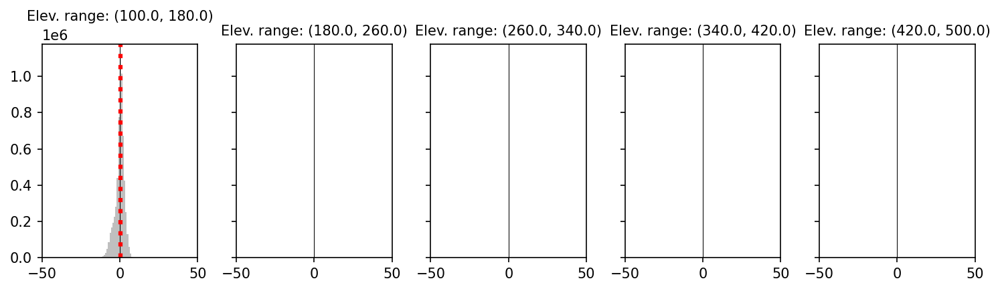

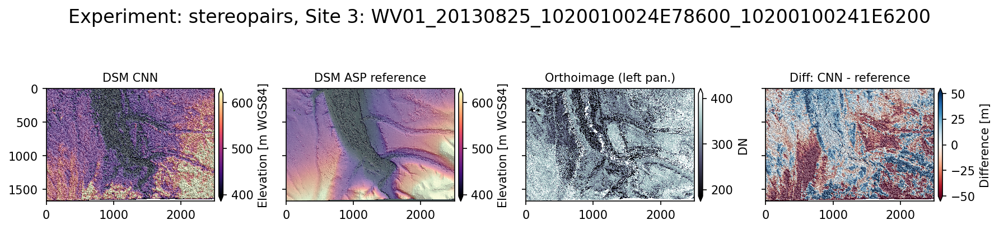

...

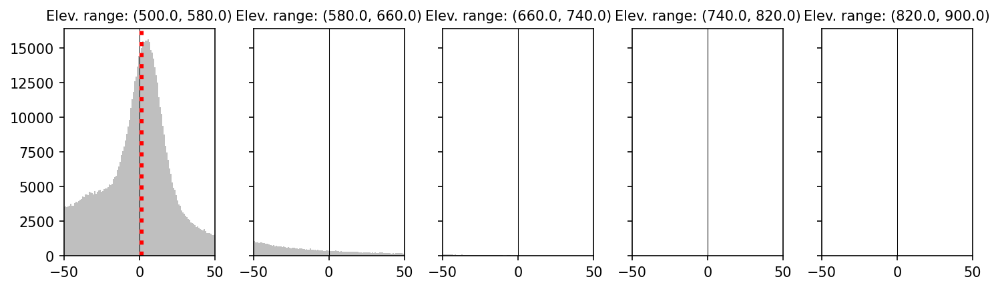

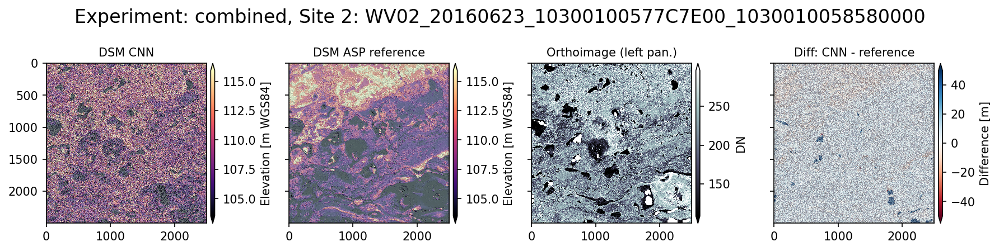

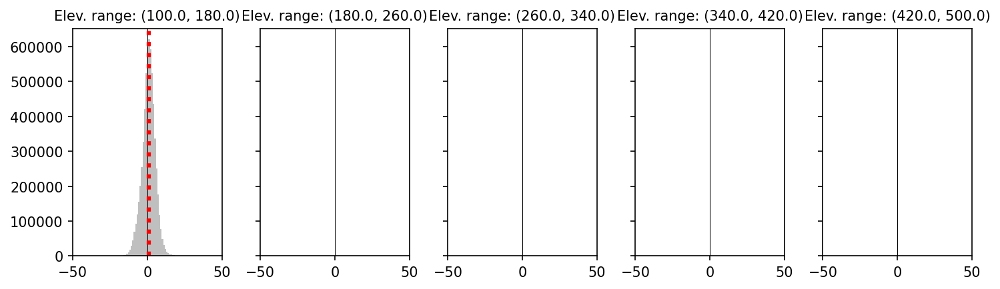

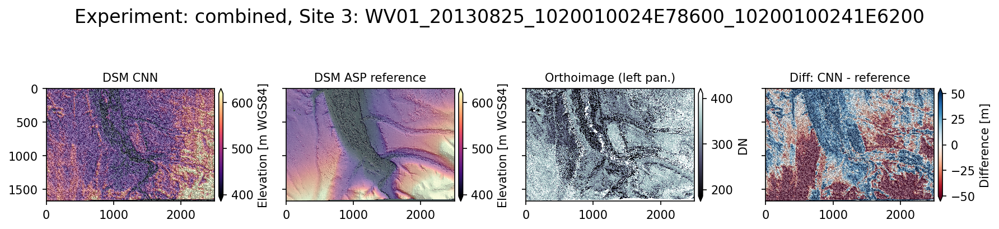

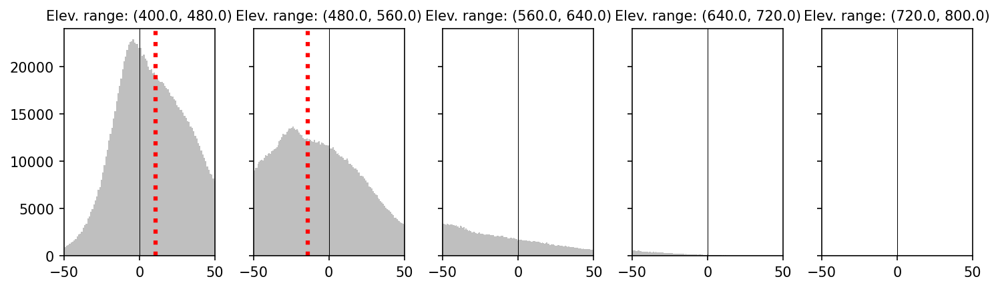

In [33]:
#DO_WARP = True # First time running? set to True
DO_SUBSET = True
df_list = [ ANALYZE_DSM_PRED(idx, EXPERIMENT_DIR, DICT, REFDSMDIR = outASP_dir, EXPERIMENT_NAME = EXPERIMENT_NAME_LIST[i], CLIM_DZ=(-50,50), ELEV_RANGE=400, SUBSET=DO_SUBSET) for i, EXPERIMENT_DIR in enumerate(EXPERIMENT_DIR_LIST) for idx in list(range(0,len(PNAME_LIST))) ]

In [ ]:
dfm = pd.concat([pd.read_csv(os.path.join(DIR, f'analyze_dsm_pred_dfm_{PNAME}_{EXPERIMENT_NAME_LIST[i]}.csv')) for i, DIR in enumerate(EXPERIMENT_DIR_LIST) for PNAME in PNAME_LIST])

In [446]:
dfm.tail()

,Unnamed: 0,PNAME,PATH,EXPERIMENT,variable,value
3725216,6064443,WV01_20130825_1020010024E78600_10200100241E6200,/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/...,stereopairs,"(850.0, 1000.0)",-280.049072
3725217,6064444,WV01_20130825_1020010024E78600_10200100241E6200,/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/...,stereopairs,"(850.0, 1000.0)",-278.811584
3725218,6064445,WV01_20130825_1020010024E78600_10200100241E6200,/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/...,stereopairs,"(850.0, 1000.0)",-275.049927
3725219,6064446,WV01_20130825_1020010024E78600_10200100241E6200,/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/...,stereopairs,"(850.0, 1000.0)",-266.597290
3725220,6064447,WV01_20130825_1020010024E78600_10200100241E6200,/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/...,stereopairs,"(850.0, 1000.0)",-260.634033


In [447]:
#dfm["value"] = dfm.value.astype(float)
dfm.dropna().info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7450127 entries, 0 to 3725220
Data columns (total 6 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Unnamed: 0  int64  
 1   PNAME       object 
 2   PATH        object 
 3   EXPERIMENT  object 
 4   variable    object 
 5   value       float64
dtypes: float64(1), int64(1), object(4)
memory usage: 397.9+ MB


## Analysis function  
built after code dev (bottom)

In [19]:
glob.glob('/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results/WV02_20160623_10300100577C7E00_1030010058580000/*cnn-dsm*.tif')

['/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results/WV02_20160623_10300100577C7E00_1030010058580000/1030010058580000.r100_0.514m_disparity.cnn-dsm-disparity-v1.tif',
 '/home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-disparity-v1/results/WV02_20160623_10300100577C7E00_1030010058580000/1030010058580000.r100_0.514m_disparity.cnn-dsm-disparity-v1_warp.tif']

In [32]:
def ranges(N, nb, min_val):
    step = N / nb
    #return ["{},{}".format(round(step*i), round(step*(i+1))) for i in range(nb)]
    return [(round(step*i)+min_val, round(step*(i+1))+min_val) for i in range(nb)]

def ANALYZE_DSM_PRED(IDX, INDIR, DICT, REFDSMDIR, EXPERIMENT_NAME, CLIM_DZ=(-10,10), IDX_DSM_ASP=1, ELEV_RANGE=500, SUBSET=False):#, DO_WARP=False):
    
    PNAME = DICT['PNAME'][IDX]
    #SITE = DICT['SITE'][IDX]
    SITE = f'Site {str(IDX + 1)}'
    
    fn_list_cnn_warp =      glob.glob(f'{INDIR}/{PNAME}/*cnn-dsm*warp.tif')
    fn_list_cnn =           glob.glob(f'{INDIR}/{PNAME}/*cnn-dsm*.tif') # First item in this list should be the CNN-predicted DSM that is NOT warped
    fn_list_asp_filled =    glob.glob(f'{REFDSMDIR}/{PNAME}/*_highres_downsampled_filled.tif')
    fn_list_ortho =         glob.glob(f'{REFDSMDIR}/{PNAME}/*_ortho_4m_warp.tif')
    fn_list_asp_reference = glob.glob(f'{REFDSMDIR}/{PNAME}/out-DEM_4m.tif')
    
    # Check if warp file exists, if not, do warp
    if len(fn_list_cnn) > 1:
        print('Warped files already exist.')
        fn_list = fn_list_cnn_warp + fn_list_asp_reference + fn_list_ortho
        DO_WARP = False
    else:
        fn_list = fn_list_cnn[0:1]  + fn_list_asp_reference + fn_list_ortho
        DO_WARP = True
    
    if DO_WARP:
        # ---Doing the warp ---
        # Warp with a write out
        warp_ds_list = warplib.diskwarp_multi_fn(fn_list, res=fn_list_asp_reference[0], extent=fn_list_asp_reference[0], t_srs=fn_list_asp_reference[0], r='near', dst_ndv=-10001, outdir=f'{INDIR}/{PNAME}')
        warp_ma_list = [iolib.ds_getma(ds) for ds in warp_ds_list]
    else:
        print(fn_list)
        warp_ma_list = [iolib.fn_getma(ds) for ds in fn_list]
        
    
    # Maybe makes plotting easier
    if SUBSET:
        start=500
        sz=2500
        warp_ma_list = [ ma[start:start+sz, start:start+sz] for ma in warp_ma_list]
        
    dz_ma = warp_ma_list[0] - warp_ma_list[1]
    
    plot_ma_list = warp_ma_list + [dz_ma]
    plot_ma_list = [np.where(ma <= -9999, np.nan, ma) for ma in plot_ma_list]
    print(f'Length of plot_ma_list: {len(plot_ma_list)}')
    # Determine elev range using DSM ASP
    CLIM_ELEV = (np.nanpercentile(warp_ma_list[IDX_DSM_ASP], DICT['LWR_PCT'][IDX]), np.nanpercentile(warp_ma_list[IDX_DSM_ASP], DICT['UPR_PCT'][IDX]))
    print(f'Elev lims: {CLIM_ELEV}')
    print(f"Rounded min elev: {DICT['ELEV_START'][IDX]}")
    #fig, axa = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, dpi=150, figsize=(10,8)) 
    fig, axa = plt.subplots(nrows=1, ncols=4, sharex=True, sharey=True, dpi=150, figsize=(12,3)) 

    # Set all layer names
    layer_names = ['DSM CNN', 'DSM ASP reference', 'Orthoimage (left pan.)', 'Diff: CNN - reference']

    # Set all cmaps
    cmap_list = ['magma', 'magma', 'bone', 'RdBu']

    # Set all labels
    label_list = ['Elevation [m WGS84]', 'Elevation [m WGS84]', 'DN', 'Difference [m]']

    # -------
    # Maps
    # -------
    print(PNAME)
    for n, ax in enumerate(axa.ravel()):

        ma = plot_ma_list[n]

        if 'Ortho' in layer_names[n]:
            #ma *= 1e-4
            im = ax.imshow(ma, interpolation='none',  cmap=cmap_list[n],  clim=(np.nanpercentile(ma, 5), np.nanpercentile(ma,95)))
            ALPHA_HILLSHADE = 0
        elif 'DEM' in layer_names[n] or 'DSM' in layer_names[n] or 'Elevation' in layer_names[n]:
            im = ax.imshow(ma, interpolation='none',  cmap=cmap_list[n],  clim=CLIM_ELEV)
            ALPHA_HILLSHADE = 0.5
        else:
            im = ax.imshow(ma, interpolation='none', cmap=cmap_list[n], clim=CLIM_DZ)
            ALPHA_HILLSHADE = 0.5

        ax.set_title(layer_names[n], fontsize=10)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='2.5%', pad=0.05)
        cb = fig.colorbar(im, cax=cax, orientation='vertical', extend='both')
        cb.set_label(label_list[n])

        # Drop Hillshade on top with alpha
        #if 'DEM' in layer_names[n] or 'DSM' in layer_names[n] or 'Slope' in layer_names[n] or 'Elevation' in layer_names[n]:
        from localtileserver import examples, helpers
        im = ax.imshow(helpers.hillshade(ma), alpha=ALPHA_HILLSHADE, interpolation='none', cmap='bone')
    
    if True:
        fig.suptitle(f'Experiment: {EXPERIMENT_NAME}, {SITE}: {PNAME}', fontsize=16)
        plt.tight_layout()
        fig.savefig(os.path.join(INDIR, f'analyze_dsm_pred_maps_{PNAME}_{EXPERIMENT_NAME}.png'), dpi=fig.dpi, bbox_inches='tight')
    
    # -------
    # Histograms
    # -------
    # Prep data for histogram plotting
    ma_asp_dem = np.where(plot_ma_list[IDX_DSM_ASP] < -9999, np.nan, plot_ma_list[IDX_DSM_ASP])
    dz_ma  = np.where(dz_ma < -9999, np.nan, dz_ma)

    # Get start elev from rounded lower CLIM
    DICT['ELEV_START'][IDX] = round(CLIM_ELEV[0]*1e-2) * 1e2
    ELEV_START = DICT['ELEV_START'][IDX]
    NSTEPS = 5
    NROW = 2
    NCOL = math.floor(NSTEPS/2) #math.floor(NSTEPS/2 + 1)
    
    # Use input elev range with data-specific start elev and steps to get elev bins
    ELEV_BINS = ranges(ELEV_RANGE, NSTEPS, ELEV_START)
    print(f'Elev bins: {ELEV_BINS}')
    
    #fig, axa = plt.subplots(nrows=NROW, ncols=NCOL, dpi=150, figsize=(10, NROW*3))
    fig, axa = plt.subplots(nrows=1, ncols=NSTEPS, dpi=150, sharey=True, figsize=(10, 3))

    arr_elev_sub_list = []
    for n, ax in enumerate(axa.ravel()):

        # This makes leftover axes empty and doesnt return an error
        if n >= NSTEPS:
            ax.axis('off')
            pass

        else:
            r = ELEV_BINS[n]

            ma_elev_sub = np.where((ma_asp_dem>=r[0]) & (ma_asp_dem < r[1]), dz_ma, np.nan)
            print(f'{(ma_elev_sub > -9999).sum():,}')
            ma_elev_sub = ma_elev_sub[~np.isnan(ma_elev_sub)].flatten()
            
            arr_elev_sub_list.append(ma_elev_sub)

            # Calc median and mad of difference array
            mad, med = malib.mad(ma_elev_sub, return_med=True)
            y, x, _ = ax.hist(ma_elev_sub, bins=512, alpha=0.25, color='k')
            ax.axvline(x=0, linewidth=0.5, c='k')
            ax.axvline(x=med, linestyle = ':',linewidth=3, color='red')
            ax.set_title(f'Elev. range: {r}', fontsize=10)
            ax.set_xlim(CLIM_DZ)
            

    # Build a df of differences to return
    df = pd.DataFrame(arr_elev_sub_list).transpose()
    print(df.head())
    df.columns = ELEV_BINS
    df['PNAME'] = PNAME
    df['PATH'] = os.path.dirname(INDIR)
    df['EXPERIMENT'] = EXPERIMENT_NAME
    dfm = pd.melt(df, id_vars=['PNAME','PATH','EXPERIMENT']).dropna()
    dfm.to_csv(os.path.join(INDIR, f'analyze_dsm_pred_dfm_{PNAME}_{EXPERIMENT_NAME}.csv'))    
    
    #fig, axa = plt.subplots(nrows=1, ncols=1, dpi=150, figsize=(10,3))  
    #sns.boxplot(data=df, ax=axa)
            
    if True:
        plt.tight_layout()
        fig.savefig(os.path.join(INDIR, f'analyze_dsm_pred_hists_{PNAME}_{EXPERIMENT_NAME}.png'), dpi=fig.dpi, bbox_inches='tight')
        
    return df

# -------
# Code dev on single pairname

In [21]:
DICT


KeyboardInterrupt



In [238]:
IDX = 0
PNAME = DICT['PNAME'][IDX]
PNAME

'WV03_20160616_104001001EBDB400_104001001E13F600'

In [239]:
fn_list_cnn =           glob.glob(f'{MAINDIR}/dsm-test-v7-mae/results/{PNAME}/*cnn-dsm*.tif')[0:1]
fn_list_asp_filled =    glob.glob(f'{OUTASP_DIR}/{PNAME}/*_highres_downsampled_filled.tif')
fn_list_ortho =         glob.glob(f'{OUTASP_DIR}/{PNAME}/*_ortho_4m.tif')
fn_list_asp_reference = glob.glob(f'{OUTASP_DIR}/{PNAME}/out-DEM_4m.tif')

In [240]:
fn_list = fn_list_cnn + fn_list_asp_reference + fn_list_ortho
[os.path.basename(fn) for fn in fn_list]

['104001001E13F600.r100_0.365m_stacked.cnn-dsm-v7.tif',
 'out-DEM_4m.tif',
 'WV03_20160616_104001001EBDB400_104001001E13F600_ortho_4m.tif']

In [241]:
# ---Doing the warp ---
# Warp with a write out 
warp_ds_list = warplib.diskwarp_multi_fn(fn_list, res=fn_list_asp_reference[0], extent=fn_list_asp_reference[0], t_srs=fn_list_asp_reference[0], r='near', dst_ndv=-10001)#, outdir=OUT_EXTENT_DIR)


Warping all inputs to the following:
Resolution: 4.0
Extent: [374706.0, 7023478.0, 390706.0, 7036274.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 3: /home/pmontesa/ilab/projects/AIML_CHM/DEM_CHM/development/dsm-test-v7-mae/results/WV03_20160616_104001001EBDB400_104001001E13F600/104001001E13F600.r100_0.365m_stacked.cnn-dsm-v7.tif
nl: 3199 ns: 4000 res: 4.000
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 3: /home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/out-DEM_4m.tif
3 of 3: /home/pmontesa/pmontesa/outASP/cnn_mode_test/WV03_20160616_104001001EBDB400_104001001E13F600/WV03_20160616_104001001EBDB400_104001001E13F600_ortho_4m.tif
nl: 3199 ns: 4000 res: 4.000
100 - done.
0...10...20...30...40...50...60...70...80...90...

In [243]:
len(warp_ds_list)

3

#### Get difference from reference ASP DSM of CNN-predicted DSM

In [244]:
#warp_ma_list = [iolib.ds_getma(ds) for ds in warp_ds_list]
if True:
    start=500
    sz=2500
    warp_ma_list = [ ma[start:start+sz, start:start+sz] for ma in [iolib.ds_getma(ds) for ds in warp_ds_list]]
dz_ma = warp_ma_list[0] - warp_ma_list[1]

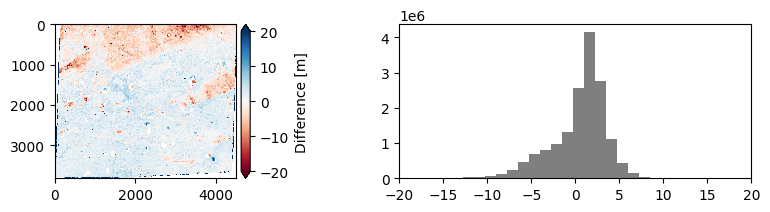

In [111]:
f, axa = plt.subplots(nrows=1, ncols=2, figsize=(10,2)) 

im = axa[0].imshow(dz_ma, interpolation='none', cmap='RdBu',clim=(-20,20)) # DSM - DTM
divider = make_axes_locatable(axa[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cb = f.colorbar(im, cax=cax, orientation='vertical', extend='both')
cb.set_label('Difference [m]')

y, x, _ = axa[1].hist(dz_ma.compressed(), bins=512, alpha=0.5, color = "black")
dsm_max =  x[np.where(y == y.max())]
mad, med = malib.mad(dz_ma, return_med=True)

#dsm_med =  x[np.where(y == np.array(y).median())]
#print('Peak for ',dsm_name,': ', format(med, '.2f'), ' +- ', format(mad, '.2f'))
axa[1].set_xlim((-20,20));

# Plot a visual summary of the layers in the stack

In [245]:
plot_ma_list = warp_ma_list + [dz_ma]

plot_ma_list = [np.where(ma <= -9999, np.nan, ma) for ma in plot_ma_list]
len(plot_ma_list)

4

In [246]:
CLIM_ELEV = (np.nanpercentile(plot_ma_list[1], DICT['LWR_PCT'][IDX]), np.nanpercentile(plot_ma_list[1], DICT['UPR_PCT'][IDX]))
DICT['ELEV_START'][IDX] = round(CLIM_ELEV[0]*1e-2) * 1e2
DICT

{'PNAME': ['WV03_20160616_104001001EBDB400_104001001E13F600'],
 'ELEV_START': [500.0, 300, 350],
 'LWR_PCT': [15, 10, 10],
 'UPR_PCT': [85, 95, 95]}

WV03_20160616_104001001EBDB400_104001001E13F600


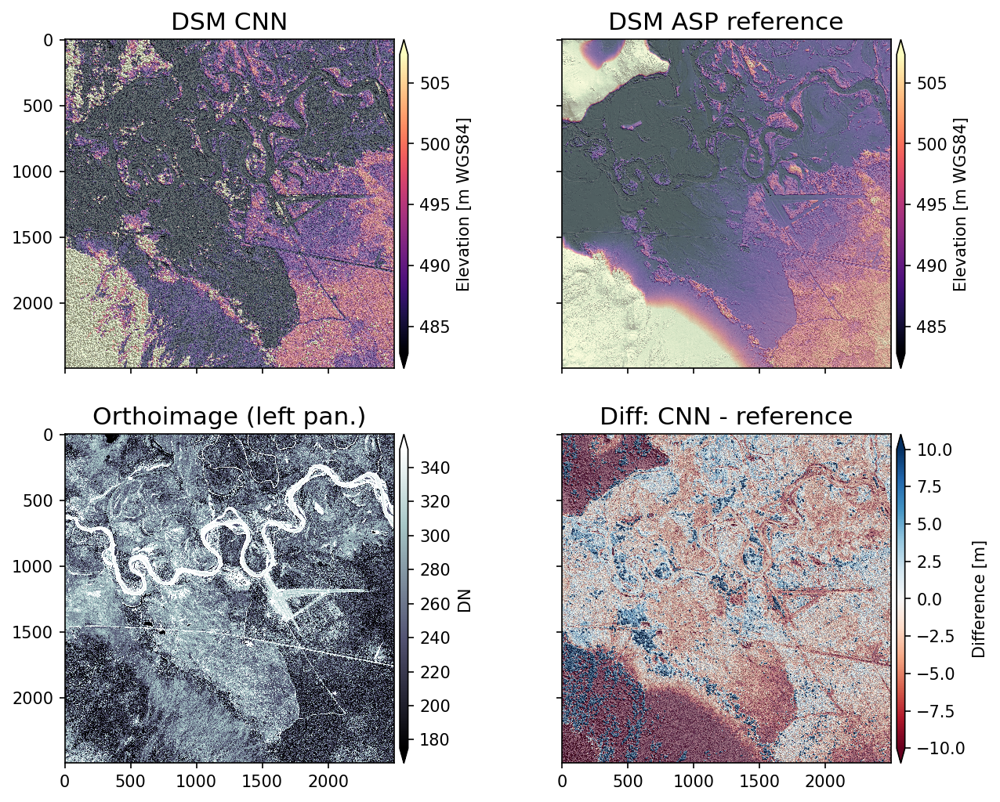

In [249]:
fig, axa = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, dpi=150, figsize=(10,8)) 

# Set all layer names
layer_names = ['DSM CNN', 'DSM ASP reference', 'Orthoimage (left pan.)', 'Diff: CNN - reference']

# Set all cmaps
cmap_list = ['magma', 'magma', 'bone', 'RdBu']

# Set all labels
label_list = ['Elevation [m WGS84]', 'Elevation [m WGS84]', 'DN', 'Difference [m]']

CLIM_DZ=(-10,10)
CLIM_ELEV = (np.nanpercentile(plot_ma_list[1], DICT['LWR_PCT'][IDX]), np.nanpercentile(plot_ma_list[1], DICT['UPR_PCT'][IDX]))
print(PNAME)
for n, ax in enumerate(axa.ravel()):

    ma = plot_ma_list[n]

    if 'Ortho' in layer_names[n]:
        #ma *= 1e-4
        im = ax.imshow(ma, interpolation='none',  cmap=cmap_list[n],  clim=(np.nanpercentile(ma, 5), np.nanpercentile(ma,95)))
        ALPHA_HILLSHADE = 0
    elif 'DEM' in layer_names[n] or 'DSM' in layer_names[n] or 'Elevation' in layer_names[n]:
        im = ax.imshow(ma, interpolation='none',  cmap=cmap_list[n],  clim=CLIM_ELEV)
        ALPHA_HILLSHADE = 0.5
    else:
        im = ax.imshow(ma, interpolation='none', cmap=cmap_list[n], clim=CLIM_DZ)
        ALPHA_HILLSHADE = 0.5
        
    ax.set_title(layer_names[n], fontsize=15)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='2.5%', pad=0.05)
    cb = f.colorbar(im, cax=cax, orientation='vertical', extend='both')
    cb.set_label(label_list[n])
    
    # Drop Hillshade on top with alpha
    #if 'DEM' in layer_names[n] or 'DSM' in layer_names[n] or 'Slope' in layer_names[n] or 'Elevation' in layer_names[n]:
    from localtileserver import examples, helpers
    im = ax.imshow(helpers.hillshade(ma), alpha=ALPHA_HILLSHADE, interpolation='none', cmap='bone')
        
#fig.suptitle(f'Site {SITE} for year {YEAR}:\n{DIR_SITE_EXTENT}', fontsize=16)
#plt.tight_layout()
#fig.savefig(os.path.join(OUT_EXTENT_DIR, f'{SITE}_{YEAR}_stack_visual_smry.png'), dpi=fig.dpi, bbox_inches='tight')

## See how the differences change across elevation ranges

#### sampling the gradient of elevations - not just the gradient of vegetation structure - is critical

In [272]:
a=np.concatenate([np.full((2,4), 1), np.full((1,4), 2)])
b=np.concatenate([np.full((1,4), 3), np.full((1,4), 4)]) #np.full((3, 5), 7)
pd.DataFrame(np.concatenate([a,b]))

,0,1,2,3
0,1,1,1,1
1,1,1,1,1
2,2,2,2,2
3,3,3,3,3
4,4,4,4,4


In [281]:
pd.DataFrame(np.transpose(np.concatenate([a,b])))

,0,1,2,3,4
0,1,1,2,3,4
1,1,1,2,3,4
2,1,1,2,3,4
3,1,1,2,3,4


In [280]:
np.transpose([a,b])

/panfs/ccds02/app/modules/jupyter/ilab/tensorflow-kernel/lib/python3.8/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


array([array([[1, 1, 1, 1],
              [1, 1, 1, 1],
              [2, 2, 2, 2]]), array([[3, 3, 3, 3],
                                     [4, 4, 4, 4]])], dtype=object)

In [247]:
# Prep data for histogram plotting
IDX_DSM_ASP = 1
ma_asp_dem = np.where(plot_ma_list[IDX_DSM_ASP] < -9999, np.nan, plot_ma_list[IDX_DSM_ASP])
dz_ma  = np.where(dz_ma< -9999, np.nan, dz_ma)

In [286]:
z = pd.DataFrame(arr_elev_sub_list).transpose()#, columns=ranges(600, NSTEPS, ELEV_START))
z.head()

,0,1,2,3,4
0,-63.951782,-137.139771,-4.852356,-104.096558,NaN
1,-50.188049,-133.730560,15.705566,-113.011780,NaN
2,-48.923645,-134.068268,3.609863,-94.765137,NaN
3,-45.791870,-129.065948,0.545166,-103.576294,NaN
4,-54.584778,-131.579041,2.377808,-84.059448,NaN


In [288]:
df = pd.DataFrame(arr_elev_sub_list).transpose()
df.columns = ranges(600, NSTEPS, ELEV_START)
#df.head()
fig, axa = plt.subplots(nrows=1, ncols=1, dpi=150, figsize=(10,4))    
sns.boxplot(data=df)

,"(500.0, 620.0)","(620.0, 740.0)","(740.0, 860.0)","(860.0, 980.0)","(980.0, 1100.0)"
0,-63.951782,-137.139771,-4.852356,-104.096558,NaN
1,-50.188049,-133.730560,15.705566,-113.011780,NaN
2,-48.923645,-134.068268,3.609863,-94.765137,NaN
3,-45.791870,-129.065948,0.545166,-103.576294,NaN
4,-54.584778,-131.579041,2.377808,-84.059448,NaN


<AxesSubplot: >

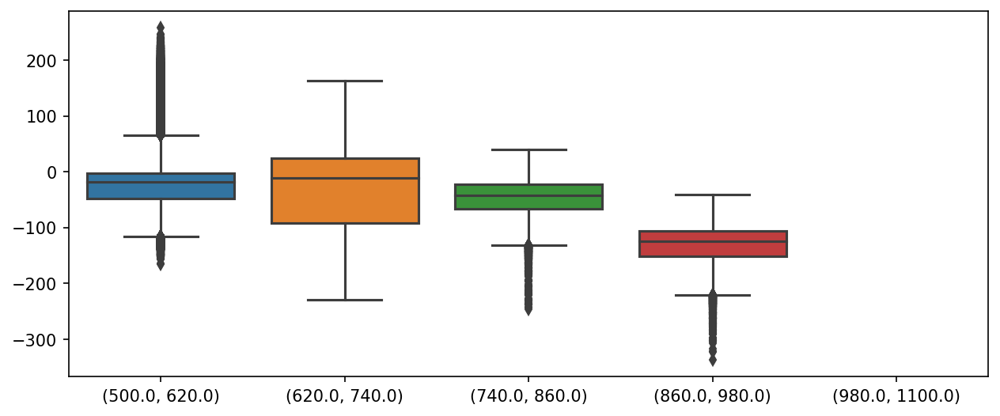

In [293]:
math.floor(NSTEPS/2+1)

3

1,042,352
200,796
48,522
14,665
0


/home/pmontesa/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1369: UserWarning: Warning: converting a masked element to nan.


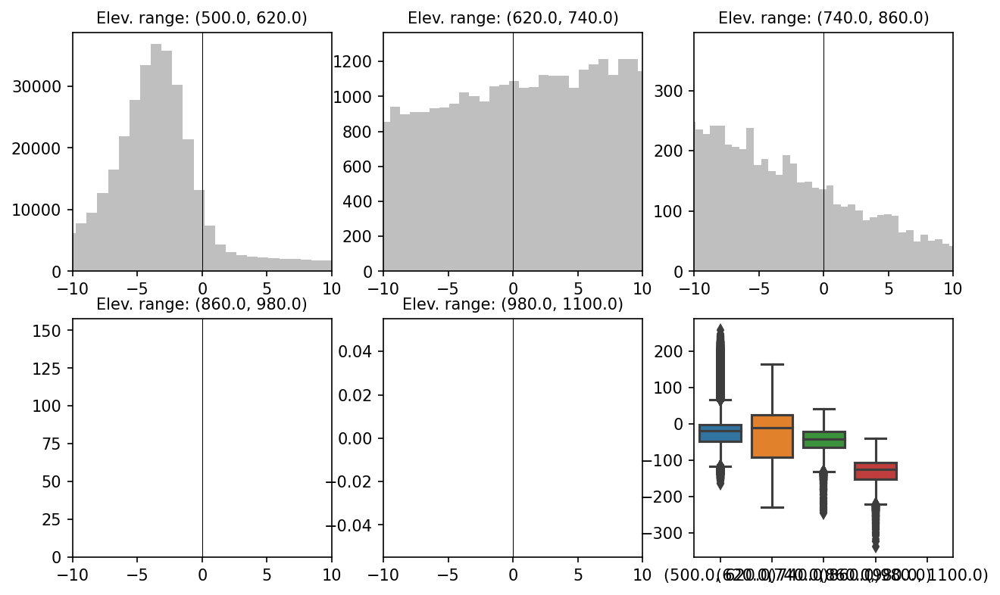

In [301]:
def ranges(N, nb, min_val):
    step = N / nb
    #return ["{},{}".format(round(step*i), round(step*(i+1))) for i in range(nb)]
    return [(round(step*i)+min_val, round(step*(i+1))+min_val) for i in range(nb)]

ELEV_START = DICT['ELEV_START'][IDX]
NSTEPS = 5
NROW = 2
NCOL = math.floor(NSTEPS/2) + 1
fig, axa = plt.subplots(nrows=NROW, ncols=NCOL,  dpi=150, figsize=(10,NROW*3))
arr_elev_sub_list = []
for n, ax in enumerate(axa.ravel()):
    
    # This makes leftover axes empty and doesnt return an error
    if n >= NSTEPS:
        #ax.axis('off')
        #pass
        df = pd.DataFrame(arr_elev_sub_list).transpose()
        df.columns = ranges(600, NSTEPS, ELEV_START)
        #df.head()
        #fig, axa = plt.subplots(nrows=1, ncols=1, dpi=150, figsize=(10,4))    
        sns.boxplot(data=df, ax=ax)
    else:
        r = ranges(600, NSTEPS, ELEV_START)[n]

        ma_elev_sub = np.where((ma_asp_dem>=r[0]) & (ma_asp_dem < r[1]), dz_ma, np.nan)
        print(f'{(ma_elev_sub > -9999).sum():,}')
        ma_elev_sub = ma_elev_sub[~np.isnan(ma_elev_sub)].flatten()

        arr_elev_sub_list.append(ma_elev_sub)

        # Calc median and mad of difference array
        mad, med = malib.mad(ma_elev_sub, return_med=True)
        y, x, _ = ax.hist(ma_elev_sub, bins=512, alpha=0.25, color='k')
        ax.axvline(x=0, linewidth=0.5, c='k')
        ax.axvline(x=med, linestyle = ':',linewidth=3, color='red')
        ax.set_title(f'Elev. range: {r}', fontsize=10)
        ax.set_xlim(CLIM_DZ)



In [98]:
!pip install -U matplotlib_scalebar

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
from matplotlib_scalebar.scalebar import ScaleBar

ModuleNotFoundError: No module named 'matplotlib_scalebar'